In [1]:
# import the dependencies
import os
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs

import matplotlib.ticker as mticker
import cartopy.crs as ccrs

from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

from shapely.geometry import shape, Point, GeometryCollection

In [2]:
CSV_PATH = os.path.join("static", "data", "csv")
IMG_PATH = os.path.join("static", "img")
FILE_NAME = "full_inventory.csv"
FILE_PATH = os.path.join(CSV_PATH, FILE_NAME)

In [3]:
# Read in the inventory file
# because 'NA' is the code for North America, we need to change pandas.read_csv default behavior
# for reading missing values (na's)...

df = pd.read_csv(FILE_PATH, keep_default_na=False, na_values=['', '#N/A', '#N/A N/A', '#NA', '-1.#IND', '-1.#QNAN', '-NaN', '-nan',
    '1.#IND', '1.#QNAN', 'N/A', 'NULL', 'NaN', 'n/a', 'nan',
    'null'])

C:\Users\dadra\anaconda\Anaconda3\envs\PythonData\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (10,11,13,18) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Bin the 2-D Data and Count the Number of Observations Per Bin
The following helper functions prepare a choropleth based on 2-d bins of the data.

In [4]:
def make_choropleth_geojson(lon, lat, bins):
    """
    bins can be any form that np.histogram2d accepts as a bins argument.
    """
    # xbins = np.linspace(-180, 180, 361)
    # ybins = np.linspace(-90, 90, 181)
    
    H, xedges, yedges = np.histogram2d(lon, lat, bins=bins)
    H = H.T
    # print(xedges)
    # print(yedges)
    return make_geojson_from_bins(H, xedges, yedges)

def make_geojson_from_bins (bin_counts, xedges, yedges):
    
    def make_polygon_coords (xcenter, ycenter, xdelta, ydelta):
        return [[
            [xcenter - xdelta, ycenter - ydelta],
            [xcenter + xdelta, ycenter - ydelta],
            [xcenter + xdelta, ycenter + ydelta],
            [xcenter - xdelta, ycenter + ydelta],
            [xcenter - xdelta, ycenter - ydelta]
        ]]
    """
    Using the output from numpy.histogram2d, create a geoJSON with geometry features of Polygons
    and properties features of the bin_counts.  This is used to create a gridded choropleth with 
    finer detail.
    """
    # print(bin_counts)
    # print(sum(bin_counts))
    m = len(bin_counts)
    n = len(bin_counts[0])
    # print(m)
    # print(n)
    
    xcenter = (xedges[:-1] + xedges[1:]) / 2
    ycenter = (yedges[:-1] + yedges[1:]) / 2
    x_delta = xcenter[0] - xedges[0]
    y_delta = ycenter[0] - yedges[0]
    
    # print(xcenter)
    # print(ycenter)
    # print(x_delta)
    # print(y_delta)
    
    features = []
    for j in range(n):
        for i in range(m):
            
            bincount = bin_counts[j, i]
            if bincount > 0:
                poly = make_polygon_coords(xcenter[i], ycenter[j], x_delta, y_delta)
           
                feature = {"type": "Feature",
                          "properties": {
                              "count": bincount
                          },
                          "geometry": {
                              "type": "Polygon",
                              "coordinates": poly
                          }}
                features.append(feature)
            
            # print(feature)
    feature_collection = {
        "type": "FeatureCollection",
        "features": features
    }
    return feature_collection

# Plot the Choropleth Using GeoPlot

In [19]:
def stations_choropleth(df, first_year, last_year, element, bins, filename, img_path=IMG_PATH):
    
    # the values of this norm are known from looking at the plots first...
    # we could compute all the choropleths first and then get a uniform norm...
    all_norm = mpl.colors.Normalize(vmin=1,vmax=180)
    
    # first filter the data
    sub_df = df[(df.element == element) & (df.first_year <= first_year) & (df.last_year >= last_year)]
    print(sub_df.shape)
    #print(sub_df.head())
    
    # now bin the data for a choropleth:
    station_bins = make_choropleth_geojson(sub_df.longitude, sub_df.latitude, bins)
    
    # convert this GEOJson to shapely polygons in a geopandas dataframe:
    station_gdf = gpd.GeoDataFrame(
    {'number': [feature['properties']['count'] for feature in station_bins['features']]},
    geometry = [shape(feature["geometry"]).buffer(0) for feature in station_bins['features']])
    
    # setup the figure:
    plt.rcParams.update({'font.size': 14})
    proj = gcrs.Robinson()
    
    extent = (-180, -90, 180, 90)
    
    fig = plt.figure(figsize=(20,16))
    #ax = plt.subplot(111, projection=proj)
    ax = plt.axes(projection=proj)
    #ax.set_extent(extent)
    ax.set_global()
    ax.stock_img()
    ax.coastlines()
    ax.outline_patch.set_visible(True)
    
    #world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    
    gplt.choropleth(station_gdf, projection=proj, ax=ax,\
                    hue='number', legend=True,\
                    extent = extent,\
                    norm=all_norm,\
                    legend_kwargs={'label': "Number of Stations", 'orientation': "horizontal"})
    #gplt.polyplot(world, zorder=-1, facecolor="lightgray", extent = extent, ax=ax)
    
    gl = ax.gridlines()
    gl.xlines = True
    gl.ylines = True
    gl.xlocator = mticker.FixedLocator([-180, -179, -160, -140, -120, -100, -80, -60, -40, -20, 0, 20, 40, 60, 80, 100, 120, 140, 160, 179, 180])
    gl.ylocator = mticker.FixedLocator([-90, -72, -54, -36, -18, 0, 18, 36, 54, 72, 90])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    
    ax.set_title(f'{first_year} - {last_year}: {element}')
    #plt.tight_layout()

    filepath = os.path.join(img_path, filename)
    fig.savefig(filepath)
    
    plt.show()
    return fig, ax

(12509, 19)


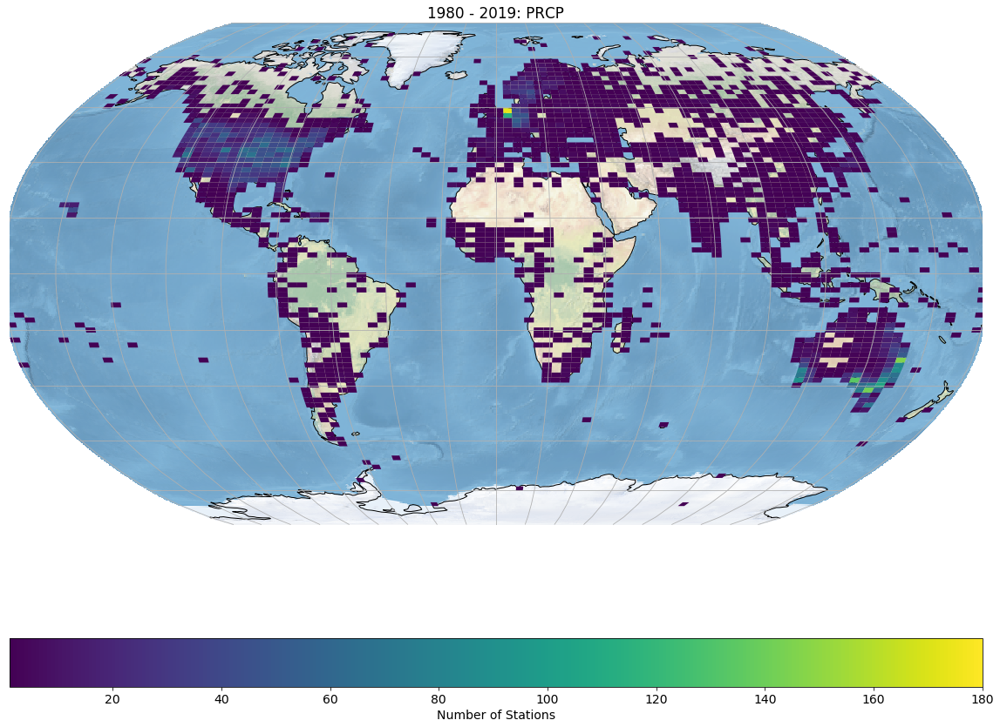

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x1309b0506d8>)

In [20]:
stations_choropleth(df, 1980, 2019, 'PRCP', 100, 'prcp-1980-2019')

(13169, 19)


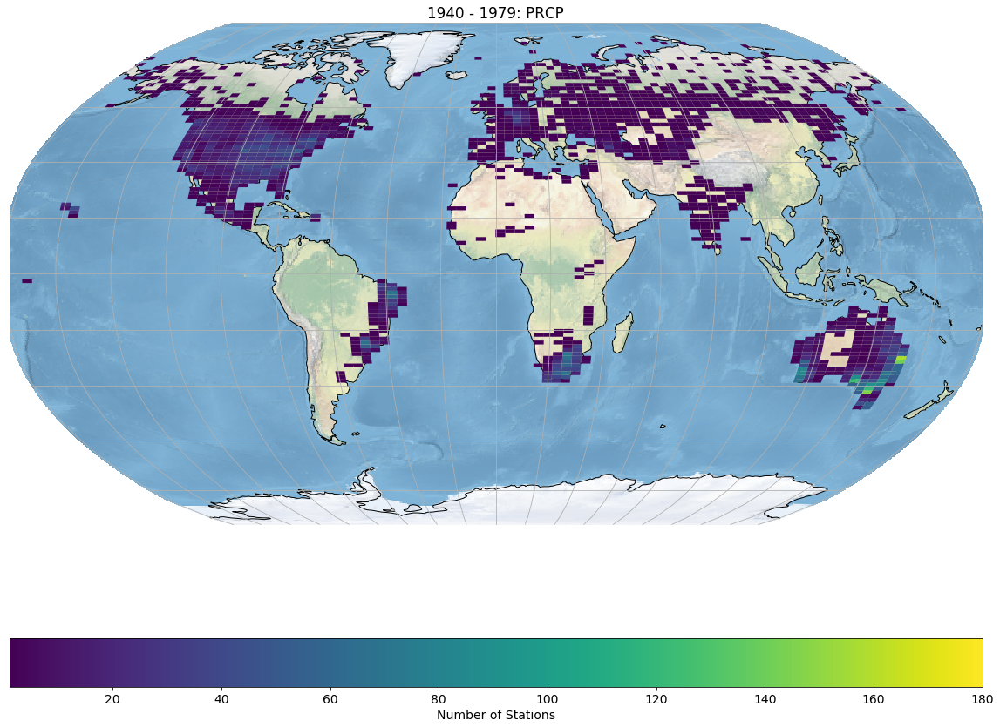

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x1309140d518>)

In [21]:
stations_choropleth(df, 1940, 1979, 'PRCP', 100, 'prcp-1940-1979')

(5970, 19)


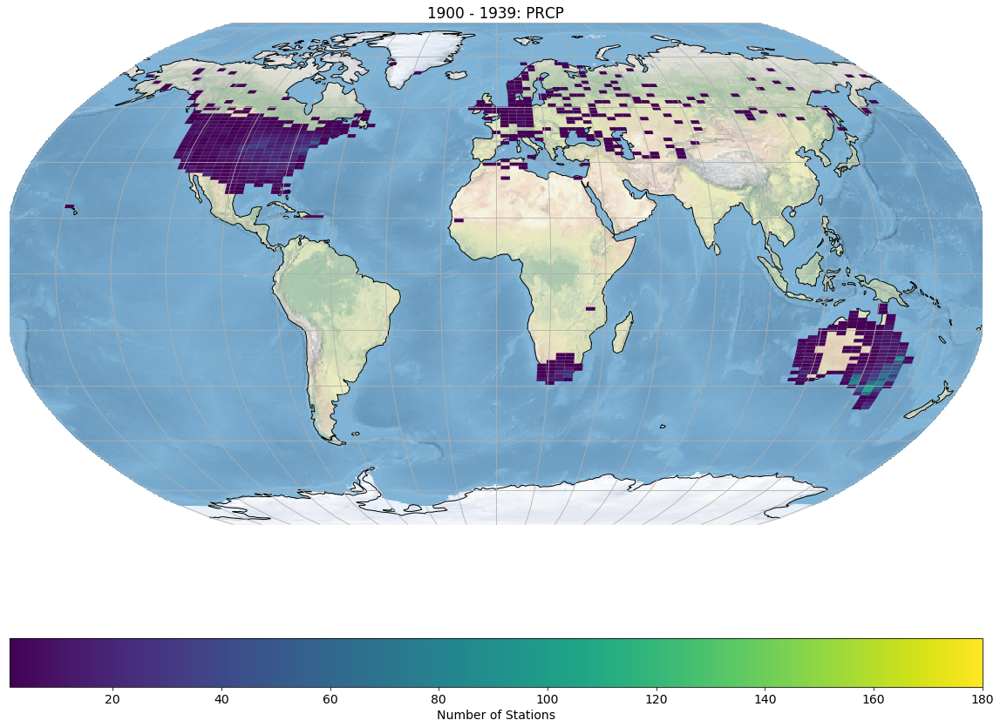

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x1308afaada0>)

In [22]:
stations_choropleth(df, 1900, 1939, 'PRCP', 100, 'prcp-1900-1939')

(57, 19)


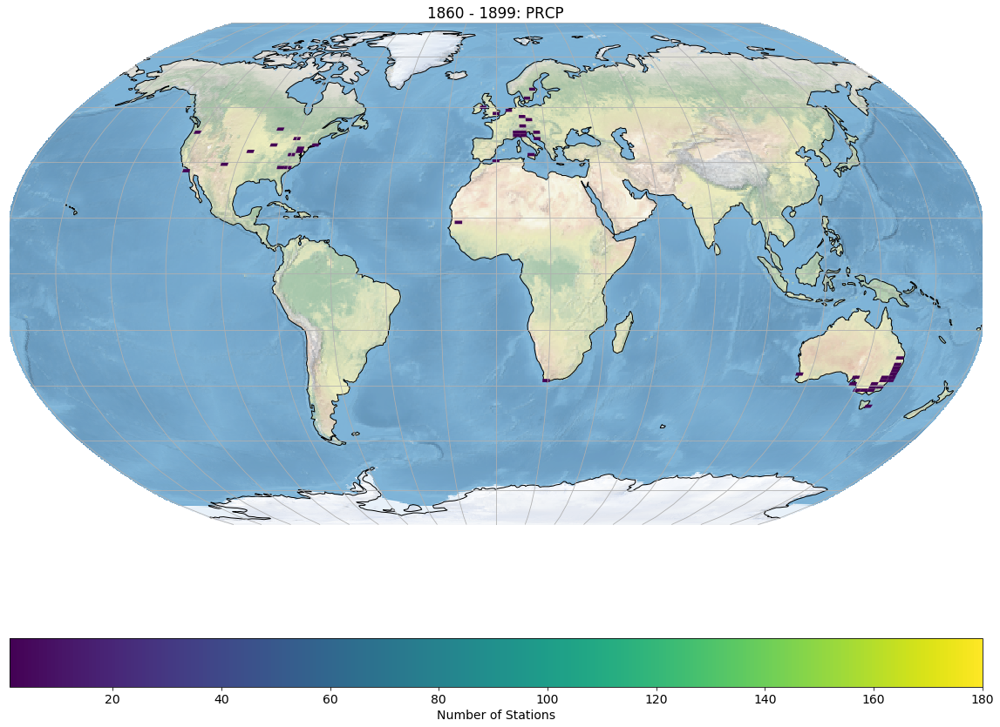

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x130a3b64908>)

In [23]:
stations_choropleth(df, 1860, 1899, 'PRCP', 100, 'prcp-1860-1899')

In [24]:
def stations_choropleth_tmax(df, first_year, last_year, element, bins, filename, img_path=IMG_PATH):
    
    # the values of this norm are known from looking at the plots first...
    # we could compute all the choropleths first and then get a uniform norm...
    all_norm = mpl.colors.Normalize(vmin=1,vmax=60)
    
    # first filter the data
    sub_df = df[(df.element == element) & (df.first_year <= first_year) & (df.last_year >= last_year)]
    print(sub_df.shape)
    #print(sub_df.head())
    
    # now bin the data for a choropleth:
    station_bins = make_choropleth_geojson(sub_df.longitude, sub_df.latitude, bins)
    
    # convert this GEOJson to shapely polygons in a geopandas dataframe:
    station_gdf = gpd.GeoDataFrame(
    {'number': [feature['properties']['count'] for feature in station_bins['features']]},
    geometry = [shape(feature["geometry"]).buffer(0) for feature in station_bins['features']])
    
    # setup the figure:
    plt.rcParams.update({'font.size': 14})
    proj = gcrs.Robinson()
    
    extent = (-180, -90, 180, 90)
    
    fig = plt.figure(figsize=(20,16))
    #ax = plt.subplot(111, projection=proj)
    ax = plt.axes(projection=proj)
    #ax.set_extent(extent)
    ax.set_global()
    ax.stock_img()
    ax.coastlines()
    ax.outline_patch.set_visible(True)
    
    #world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    
    gplt.choropleth(station_gdf, projection=proj, ax=ax,\
                    hue='number', legend=True,\
                    extent = extent,\
                    norm=all_norm,\
                    legend_kwargs={'label': "Number of Stations", 'orientation': "horizontal"})
    #gplt.polyplot(world, zorder=-1, facecolor="lightgray", extent = extent, ax=ax)
    
    gl = ax.gridlines()
    gl.xlines = True
    gl.ylines = True
    gl.xlocator = mticker.FixedLocator([-180, -179, -160, -140, -120, -100, -80, -60, -40, -20, 0, 20, 40, 60, 80, 100, 120, 140, 160, 179, 180])
    gl.ylocator = mticker.FixedLocator([-90, -72, -54, -36, -18, 0, 18, 36, 54, 72, 90])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    
    ax.set_title(f'{first_year} - {last_year}: {element}')
    #plt.tight_layout()

    filepath = os.path.join(img_path, filename)
    fig.savefig(filepath)
    
    plt.show()
    return fig, ax

(7502, 19)


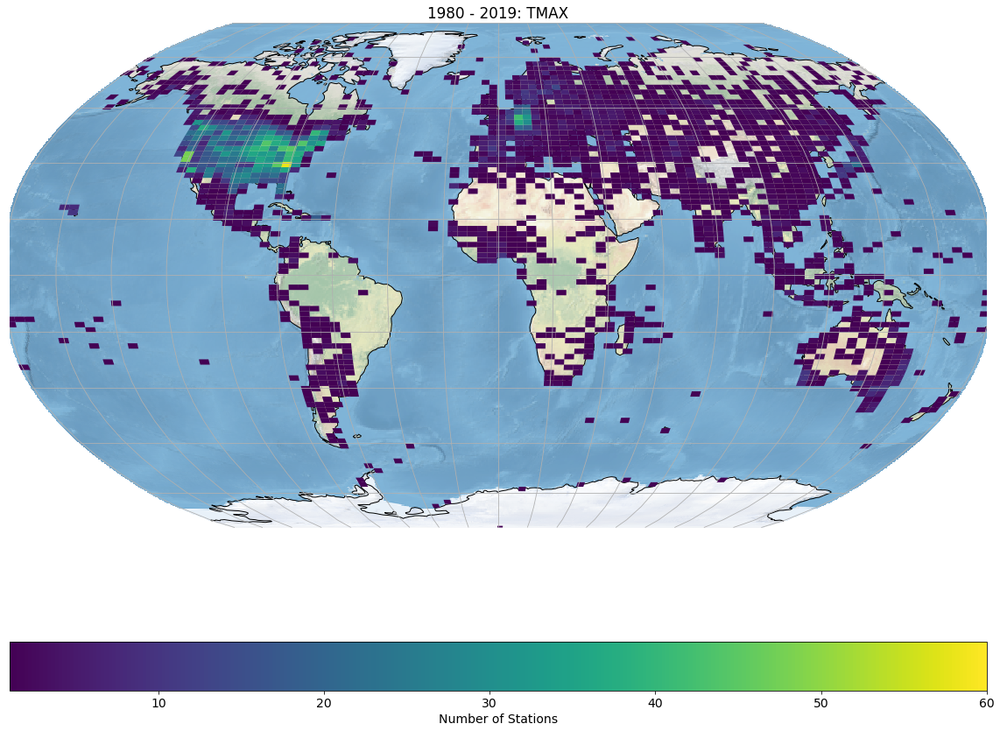

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x130a4280da0>)

In [25]:
stations_choropleth_tmax(df, 1980, 2019, 'TMAX', 100, 'tmax-1980-2019')

(4885, 19)


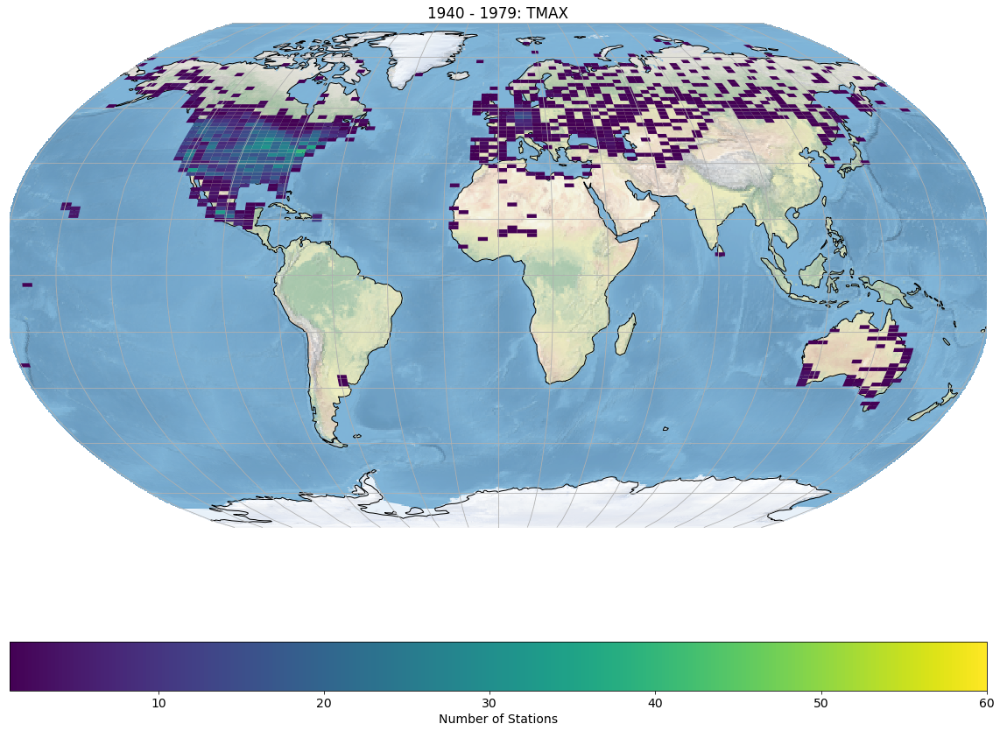

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x130a409e780>)

In [26]:
stations_choropleth_tmax(df, 1940, 1979, 'TMAX', 100, 'tmax-1940-1979')

(2405, 19)


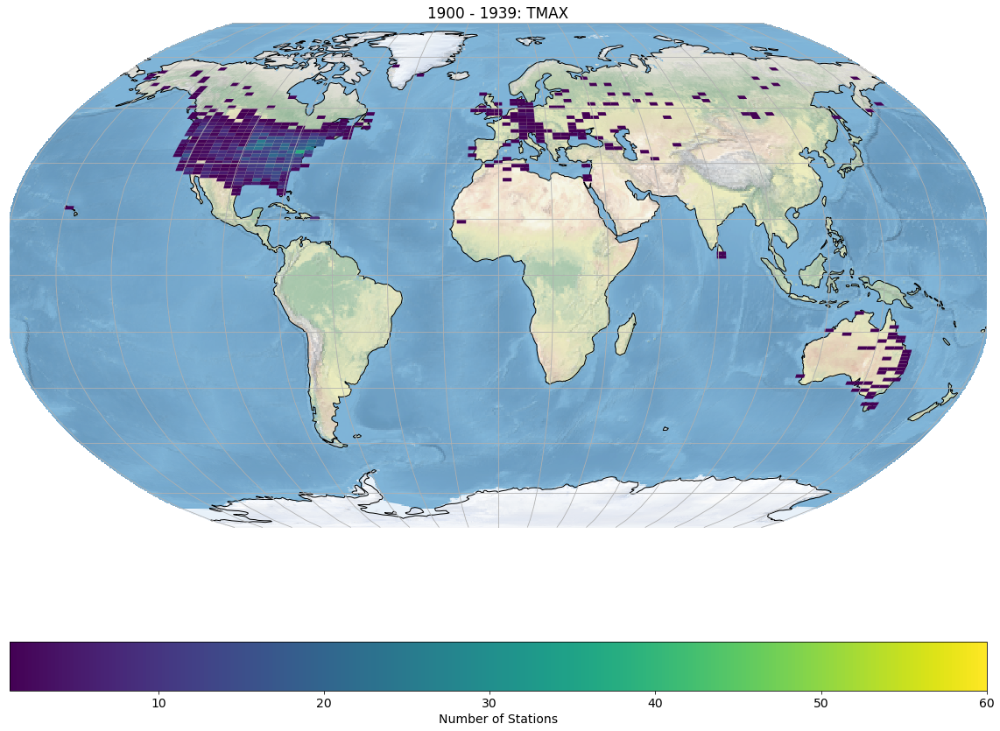

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x130a41b4390>)

In [27]:
stations_choropleth_tmax(df, 1900, 1939, 'TMAX', 100, 'tmax-1900-1939')

(19, 19)


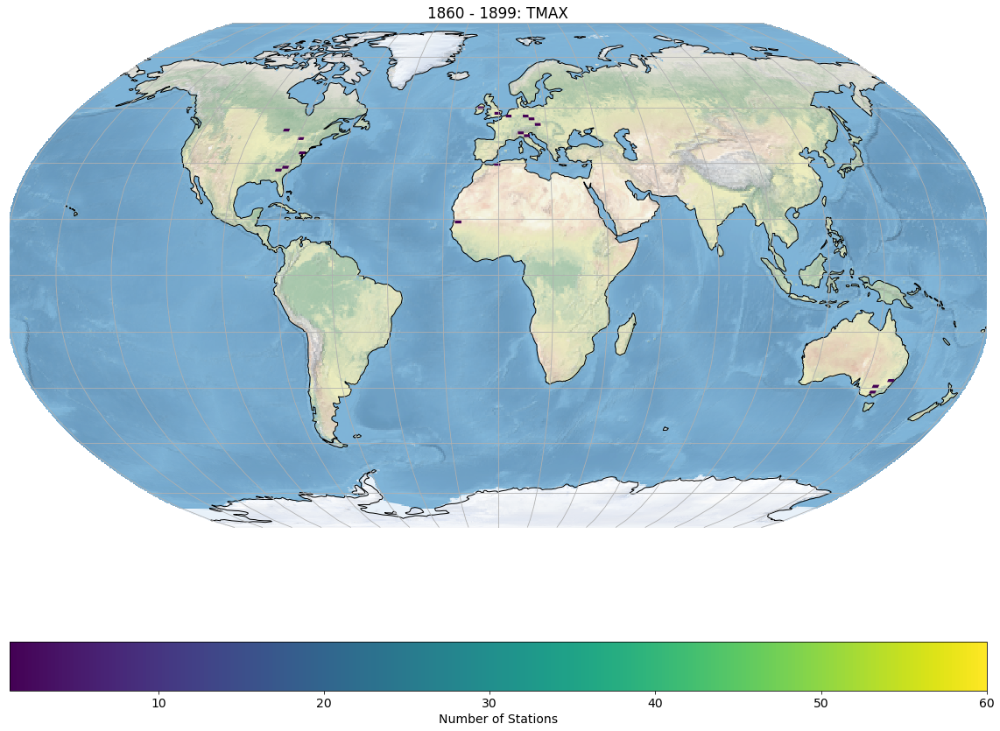

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x130af104780>)

In [28]:
stations_choropleth_tmax(df, 1860, 1899, 'TMAX', 100, 'tmax-1860-1899')

In [29]:
def stations_choropleth_1year(df, first_year, last_year, element, bins, filename, img_path=IMG_PATH):
    
    # the values of this norm are known from looking at the plots first...
    # we could compute all the choropleths first and then get a uniform norm...
    # all_norm = mpl.colors.Normalize(vmin=1,vmax=60)
    
    # first filter the data
    sub_df = df[(df.element == element) & (df.first_year <= first_year) & (df.last_year >= last_year)]
    print(sub_df.shape)
    #print(sub_df.head())
    
    plt.rcParams.update({'font.size': 14})
    
    # now bin the data for a choropleth:
    station_bins = make_choropleth_geojson(sub_df.longitude, sub_df.latitude, bins)
    
    # convert this GEOJson to shapely polygons in a geopandas dataframe:
    station_gdf = gpd.GeoDataFrame(
    {'number': [feature['properties']['count'] for feature in station_bins['features']]},
    geometry = [shape(feature["geometry"]).buffer(0) for feature in station_bins['features']])
    
    # setup the figure:
    proj = gcrs.Robinson()
    extent = (-180, -90, 180, 90)
    #extent = extent + (-0.5, -0.5, 0.5, 0.5)
    
    fig = plt.figure(figsize=(20,16))
    #ax = plt.subplot(111, projection=proj)
    ax = plt.axes(projection=proj)
    #ax.set_extent(extent)
    ax.set_global()
    ax.stock_img()
    ax.coastlines()
    ax.outline_patch.set_visible(True)
    
    #world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    
    gplt.choropleth(station_gdf, projection=proj, ax=ax,\
                    hue='number', legend=True,\
                    extent = extent,\
                    #norm=all_norm,\
                    legend_kwargs={'label': "Number of Stations", 'orientation': "horizontal"})
    #gplt.polyplot(world, zorder=-1, facecolor="lightgray", extent = extent, ax=ax)
    
    gl = ax.gridlines()
    gl.xlines = True
    gl.ylines = True
    gl.xlocator = mticker.FixedLocator([-180, -179, -160, -140, -120, -100, -80, -60, -40, -20, 0, 20, 40, 60, 80, 100, 120, 140, 160, 179, 180])
    gl.ylocator = mticker.FixedLocator([-90, -72, -54, -36, -18, 0, 18, 36, 54, 72, 90])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    
    ax.set_title(f'{first_year}: {element}')
    #plt.tight_layout()

    filepath = os.path.join(img_path, filename)
    fig.savefig(filepath)
    
    plt.show()
    return fig, ax

(14168, 19)


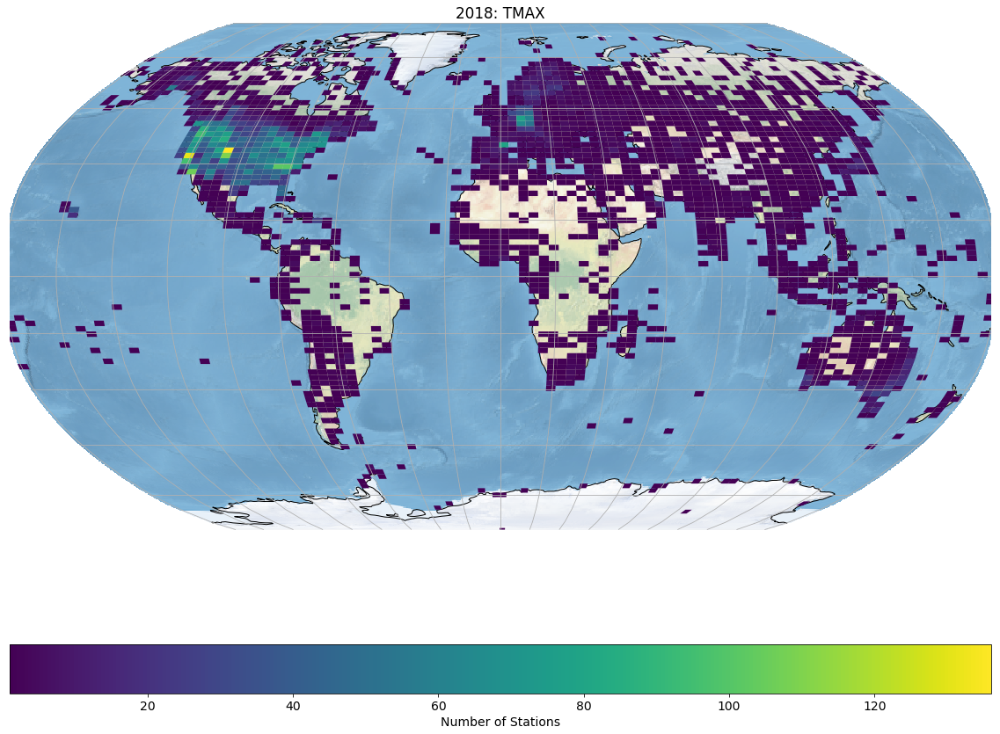

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x130b41dc2e8>)

In [30]:
stations_choropleth_1year(df, 2018, 2018, 'TMAX', 100, 'tmax-2018')

(39348, 19)


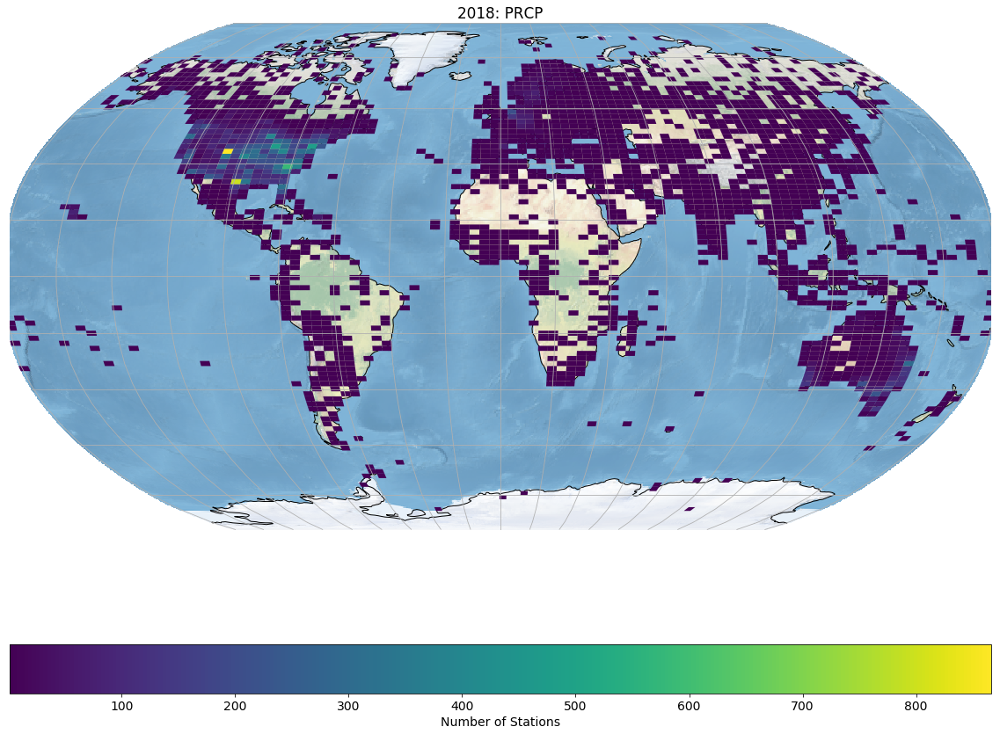

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x130b6a23e80>)

In [31]:
stations_choropleth_1year(df, 2018, 2018, 'PRCP', 100, 'prcp-2018')

(20041, 19)


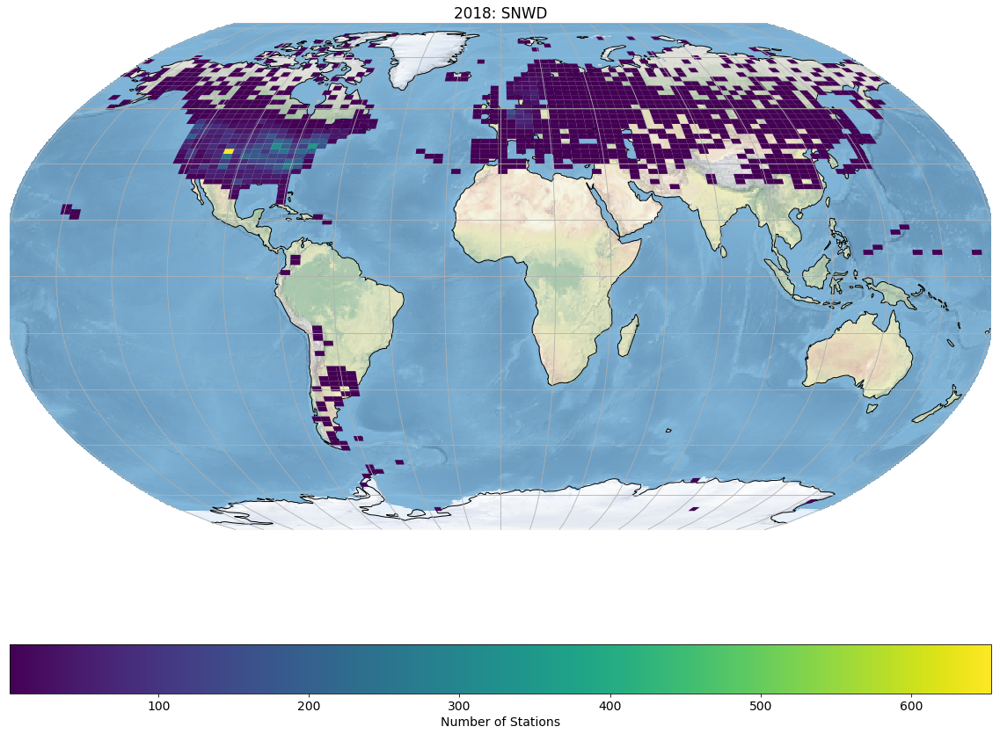

(<Figure size 1440x1152 with 2 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x130af226710>)

In [32]:
stations_choropleth_1year(df, 2018, 2018, 'SNWD', 100, 'snwd-2018')